
# 1. Import Dependencies and Data

In [1]:
# Bringing in tensorflow
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus: 
    tf.config.experimental.set_memory_growth(gpu, True)

In [2]:
# Brining in tensorflow datasets for tf flowers
import tensorflow_datasets as tfds
# Bringing in matplotlib for viz stuff
from matplotlib import pyplot as plt

In [3]:
# Download the dataset
ds = tfds.load('tf_flowers', split='train')
print(len(list(ds)))

Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset tf_flowers downloaded and prepared to /root/tensorflow_datasets/tf_flowers/3.0.1. Subsequent calls will reuse this data.
3670



# 2. Viz Data and Build Dataset

In [4]:
# Do some data transformation
import numpy as np

In [5]:
# Setup connection aka iterator
dataiterator = ds.as_numpy_iterator()

In [6]:
# Getting one data out of the pipeline
dataiterator.next()['image']

array([[[ 93, 122,  30],
        [ 90, 118,  31],
        [ 88, 118,  28],
        ...,
        [247,  77,  78],
        [253,  87,  87],
        [255,  76,  75]],

       [[ 98, 125,  30],
        [ 95, 124,  32],
        [ 96, 125,  32],
        ...,
        [247,  81,  83],
        [250,  86,  84],
        [252,  71,  64]],

       [[ 98, 126,  26],
        [101, 128,  31],
        [106, 132,  33],
        ...,
        [254,  81,  85],
        [254,  79,  76],
        [252,  55,  47]],

       ...,

       [[ 35,  51,   6],
        [ 21,  49,   0],
        [ 30,  57,   6],
        ...,
        [224, 239,  78],
        [192, 208,  50],
        [ 88,  54,  53]],

       [[ 65,  73,  32],
        [ 20,  46,   0],
        [ 22,  48,   0],
        ...,
        [230, 236,  74],
        [230, 246,  62],
        [ 88,  57,  36]],

       [[ 95,  97,  60],
        [ 15,  41,   0],
        [ 23,  51,   3],
        ...,
        [210, 224,  40],
        [210, 241,  23],
        [ 93,  87,  11]]

In [7]:
def visualize_samples(dataiterator):
  # Setup the subplot formatting 
  fig, ax = plt.subplots(ncols=4, figsize=(20,20))
  # Loop four times and get images 
  for idx in range(4): 
      # Grab an image and label
      sample = dataiterator.next()
      # Plot the image using a specific subplot 
      ax[idx].imshow(np.squeeze(sample['image']))
      # Appending the image label as the plot title 
      ax[idx].title.set_text(sample['label'])

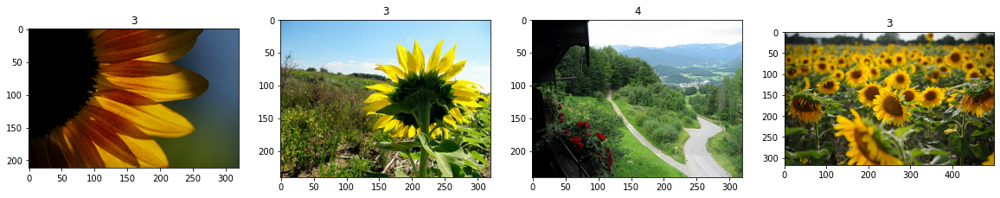

In [8]:
visualize_samples(dataiterator)

## Data Preprocessing and Augmentation

In [9]:
from tensorflow.keras.layers import Resizing, Rescaling, RandomFlip

In [10]:
# Reload the dataset 
(train_ds), metadata = tfds.load(
    'tf_flowers',
    split='train',
    with_info=True,
    as_supervised=True,
)

In [11]:
len(train_ds)

3670

In [12]:
# Image height and width
h, w = 64, 64

batch_size = 128
class_number = 5

# AUTOTUNE will prompt the tf.data runtime to tune the value dynamically at runtime.
AUTOTUNE = tf.data.AUTOTUNE

In [13]:
# Define resize and rescale layer for image
resize_and_rescale = tf.keras.Sequential([
  Resizing(h, w),
  Rescaling(1./255)
])

# Augment the data to include random horizontal flipping
data_augmentation = tf.keras.Sequential([
  RandomFlip("horizontal")
])


In [14]:
def preprocessing(ds, shuffle=False, augment=False):
  # Resize and rescale all datasets.
  ds = ds.map(lambda x, y: (resize_and_rescale(x), y), num_parallel_calls=AUTOTUNE)

  if shuffle:
    ds = ds.shuffle(1000)

  # Batch all datasets.
  ds = ds.batch(batch_size)

  # Use data augmentation only on the training set.
  if augment:
    ds = ds.map(lambda x, y: (data_augmentation(x, training=True), y), num_parallel_calls=AUTOTUNE)

  # Use buffered prefetching on all datasets.
  return ds.prefetch(buffer_size=AUTOTUNE)


In [15]:
flower_ds = preprocessing(train_ds, shuffle=True, augment=True)

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


# 3. Build Neural Network

## 3.1 Import Modelling Components

In [16]:
# Bring in the sequential api for the generator and discriminator
from tensorflow.keras.models import Sequential
# Bring in the layers for the neural network
from tensorflow.keras.layers import InputLayer, Conv2D, Dense, Flatten, Reshape, LeakyReLU, Dropout, UpSampling2D, \
                                   BatchNormalization, Activation, Conv2DTranspose, MaxPooling2D
# Bring in the activations for the neural network
from tensorflow.keras.activations import sigmoid, relu

## 3.2 Build Generator

In [17]:
def build_generator(num_filters=64, filter_size=5): 
    model = Sequential()
    
    # Takes in random values and reshapes it to 4x4x215
    # Beginnings of a generated image
    model.add(Dense(4*4*512, input_dim=100))
    model.add(Reshape((4,4,512)))
    
    model.add(Conv2DTranspose(4*num_filters, filter_size))
    model.add(BatchNormalization())
    model.add(Activation(relu))

    model.add(Conv2DTranspose(2*num_filters, filter_size, strides=2, padding="same"))
    model.add(BatchNormalization())
    model.add(Activation(relu))

    model.add(Conv2DTranspose(num_filters, filter_size, strides=2, padding="same"))
    model.add(BatchNormalization())
    model.add(Activation(relu))

    model.add(Conv2DTranspose(3, filter_size, strides=2, padding="same", activation="sigmoid"))
    
    return model

In [18]:
generator = build_generator()

In [19]:
generator.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 8192)              827392    
                                                                 
 reshape (Reshape)           (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 256)        3277056   
 nspose)                                                         
                                                                 
 batch_normalization (BatchN  (None, 8, 8, 256)        1024      
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 16, 16, 128)     

In [20]:
# Get one image sample without model training
img = generator.predict(np.random.randn(1,100,1))

1/1 [==============================] - 8s 8s/step


In [21]:
img.shape

(1, 64, 64, 3)

In [22]:
img[0]

array([[[0.50000566, 0.4998807 , 0.5000376 ],
        [0.50023085, 0.50009614, 0.5001903 ],
        [0.49981457, 0.4999243 , 0.49993384],
        ...,
        [0.5003798 , 0.50063723, 0.5002687 ],
        [0.4998489 , 0.49987522, 0.4999379 ],
        [0.50006986, 0.5000276 , 0.49997675]],

       [[0.49995422, 0.50002736, 0.5000541 ],
        [0.49983895, 0.50045437, 0.49998796],
        [0.49993145, 0.5001426 , 0.5000162 ],
        ...,
        [0.4998882 , 0.50070083, 0.4998234 ],
        [0.49955276, 0.49997842, 0.5000138 ],
        [0.49982738, 0.50007737, 0.4997172 ]],

       [[0.49989584, 0.5000011 , 0.49999297],
        [0.5000241 , 0.50027114, 0.49982327],
        [0.4998764 , 0.49995553, 0.49985638],
        ...,
        [0.50025785, 0.500053  , 0.5000836 ],
        [0.50051236, 0.49999177, 0.49969262],
        [0.5002013 , 0.5000181 , 0.49982387]],

       ...,

       [[0.49977022, 0.5001952 , 0.49977112],
        [0.49985054, 0.4999925 , 0.4997969 ],
        [0.4992967 , 0

1/1 [==============================] - 0s 114ms/step


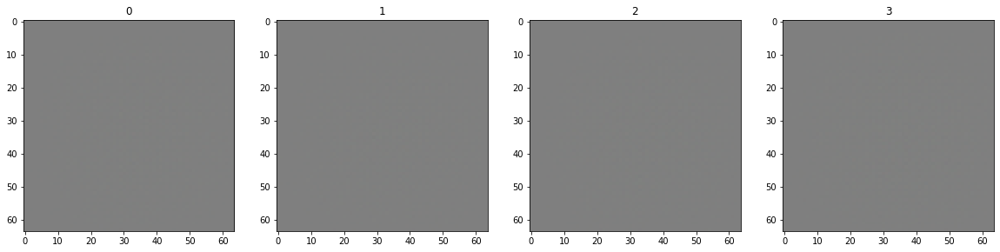

In [23]:
# Generate new flower
imgs = generator.predict(np.random.randn(4,100,1))
# Setup the subplot formatting 
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
# Loop four times and get images 
for idx, img in enumerate(imgs): 
    # Plot the image using a specific subplot 
    ax[idx].imshow(img)
    # Appending the image label as the plot title 
    ax[idx].title.set_text(idx)

## 3.3 Build Discriminator

In [24]:
def build_discriminator(dropout_prob=0.5, num_filters=8, filter_size=3, scale=0.2): 
    model = Sequential()
    model.add(InputLayer(input_shape=(h,w,3)))

    model.add(Conv2D(num_filters, filter_size))
    model.add(LeakyReLU(scale))
    model.add(MaxPooling2D())

    model.add(Conv2D(2*num_filters, filter_size))
    model.add(LeakyReLU(scale))
    model.add(MaxPooling2D())


    model.add(Conv2D(4*num_filters, filter_size))
    model.add(LeakyReLU(scale))
    model.add(MaxPooling2D())


    model.add(Conv2D(8*num_filters, filter_size))
    model.add(LeakyReLU(scale))
    model.add(MaxPooling2D())

    model.add(Flatten())
    model.add(Dropout(dropout_prob))
    model.add(Dense(1, activation='sigmoid'))
    # model.add(Conv2D(1, 4, activation='sigmoid'))

    # model.add(Activations(sigmoid))
    return model 

In [25]:
discriminator = build_discriminator()

In [26]:
discriminator.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 62, 62, 8)         224       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 62, 62, 8)         0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 31, 31, 8)        0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 29, 29, 16)        1168      
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 29, 29, 16)        0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 14, 14, 16)       0         
 2D)                                                  

In [27]:
img = generator.predict(np.random.randn(1,100,1))

1/1 [==============================] - 0s 24ms/step


In [28]:
# Get one sample prediction without model training
discriminator.predict(img)

1/1 [==============================] - 1s 502ms/step


array([[0.5143481]], dtype=float32)

# 4. Construct Training Loop

## 4.1 Setup Losses and Optimizers

In [29]:
# Adam is going to be the optimizer for both
from tensorflow.keras.optimizers import Adam
# Binary cross entropy is going to be the loss for both 
from tensorflow.keras.losses import BinaryCrossentropy

In [30]:
# Set optimizers and Losses
g_opt = Adam(learning_rate=0.0001, beta_1=0.5, beta_2=0.999) 
d_opt = Adam(learning_rate=0.00001, beta_1=0.5, beta_2=0.999) 
g_loss = BinaryCrossentropy()
d_loss = BinaryCrossentropy()

## 4.2 Build Subclassed Model

In [31]:
# Importing the base model class to subclass our training step 
from tensorflow.keras.models import Model

In [32]:
class FlowerGAN(Model): 
    def __init__(self, generator, discriminator, *args, **kwargs):
        # Pass through args and kwargs to base class 
        super().__init__(*args, **kwargs)
        
        # Create attributes for gen and disc
        self.generator = generator 
        self.discriminator = discriminator 
        
    def compile(self, d_opt, g_opt, d_loss, g_loss, *args, **kwargs): 
        # Compile with base class
        super().compile(*args, **kwargs)
        
        # Create attributes for losses and optimizers
        self.d_opt = d_opt
        self.g_opt = g_opt
        self.d_loss = d_loss
        self.g_loss = g_loss 

    def train_step(self, batch):
        # Get the data 
        real_images, labels = batch
        fake_images = self.generator(tf.random.normal((128, 100, 1)), training=False)
        
        # Train the discriminator with real images
        with tf.GradientTape() as real_d_tape: 
            # Pass the real images to the discriminator model
            yhat_real = self.discriminator(real_images, training=True) 

            # Create labels for real images
            y_real = tf.zeros_like(yhat_real)
            
            # Add some noise to the outputs
            noise_real = 0.15*tf.random.uniform(tf.shape(yhat_real))
            y_real += noise_real
            
            # Calculate loss - BINARYCROSS 
            real_d_loss = self.d_loss(y_real, yhat_real)
            
        # Apply backpropagation - nn learn 
        real_dgrad = real_d_tape.gradient(real_d_loss, self.discriminator.trainable_variables) 
        self.d_opt.apply_gradients(zip(real_dgrad, self.discriminator.trainable_variables))

        # Train the discriminator with fake images
        with tf.GradientTape() as fake_d_tape: 
            # Pass the fake images to the discriminator model
            yhat_fake = self.discriminator(fake_images, training=True)
            
            # Create labels for fakes images
            y_fake = tf.ones_like(yhat_fake)
            
            # Add some noise to the outputs
            noise_fake = -0.15*tf.random.uniform(tf.shape(yhat_fake))
            y_fake += noise_fake
            
            # Calculate loss - BINARYCROSS 
            fake_d_loss = self.d_loss(y_fake, yhat_fake)
            
        # Apply backpropagation - nn learn 
        fake_dgrad = fake_d_tape.gradient(fake_d_loss, self.discriminator.trainable_variables) 
        self.d_opt.apply_gradients(zip(fake_dgrad, self.discriminator.trainable_variables))
        
        # Train the generator 
        with tf.GradientTape() as g_tape: 
            # Generate some new images
            gen_images = self.generator(tf.random.normal((128,100,1)), training=True)
                                        
            # Create the predicted labels
            predicted_labels = self.discriminator(gen_images, training=False)
                                        
            # Calculate loss - trick to training to fake out the discriminator
            total_g_loss = self.g_loss(tf.zeros_like(predicted_labels), predicted_labels) 
            
        # Apply backprop
        ggrad = g_tape.gradient(total_g_loss, self.generator.trainable_variables)
        self.g_opt.apply_gradients(zip(ggrad, self.generator.trainable_variables))
        
        return {"real_d_loss":real_d_loss, "fake_d_loss":fake_d_loss, "g_loss":total_g_loss}

In [33]:
# Create instance of subclassed model
flower_gan = FlowerGAN(generator, discriminator)

In [34]:
# Compile the model
flower_gan.compile(g_opt, d_opt, g_loss, d_loss)

## 4.3 Build Callback

In [35]:
import os
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.callbacks import Callback, TensorBoard, ModelCheckpoint

In [36]:
# Make dir for generated images
gan_image_dir = './images'
os.makedirs(gan_image_dir, exist_ok=True)

In [37]:
class ModelMonitor(Callback):
    def __init__(self, random_latent_vectors):
      self.random_latent_vectors = random_latent_vectors

    def on_epoch_end(self, epoch, logs=None):
        # Show generated image every 10 epochs
        if epoch % 10 == 0:
          generated_images = self.model.generator(self.random_latent_vectors)
          generated_images *= 255
          generated_images.numpy()
          img = array_to_img(generated_images[0])
          img.save(os.path.join('images', f'generated_img_{epoch}.png'))

In [38]:
# Prepare callbacks
rlv = tf.random.normal((1, 100, 1))

log_dir= os.path.join(os.getcwd(), 'logs', 'model')
tb_callback = TensorBoard(log_dir)


save_dir = './saved_models'
model_name = 'gan_model.h5'
os.makedirs(save_dir, exist_ok=True)
filepath = os.path.join(save_dir, model_name)
checkpoint = ModelCheckpoint(filepath=filepath,
                             monitor='loss',
                             verbose=0,
                             save_best_only=False,
                             save_weights_only=True)

callbacks = [checkpoint, tb_callback, ModelMonitor(rlv)]

## 4.4 Train

In [39]:
import time

In [40]:
# Nicely formatted time string
def hms_string(sec_elapsed):
    h = int(sec_elapsed / (60 * 60))
    m = int((sec_elapsed % (60 * 60)) / 60)
    s = sec_elapsed % 60
    return f"{h}:{m:>02}:{s:>05.2f}"

In [41]:
start_time = time.time()

hist = flower_gan.fit(flower_ds, epochs=270, callbacks=callbacks)

elapsed_time = time.time() - start_time
print("Elapsed time: {}".format(hms_string(elapsed_time)))

Epoch 1/270
29/29 [==============================] - 14s 157ms/step - real_d_loss: 0.6270 - fake_d_loss: 0.6973 - g_loss: 0.6083
Epoch 2/270
29/29 [==============================] - 4s 115ms/step - real_d_loss: 0.4077 - fake_d_loss: 0.6976 - g_loss: 0.1706
Epoch 3/270
29/29 [==============================] - 3s 85ms/step - real_d_loss: 0.3217 - fake_d_loss: 0.6192 - g_loss: 0.0195
Epoch 4/270
29/29 [==============================] - 3s 84ms/step - real_d_loss: 0.3259 - fake_d_loss: 0.4527 - g_loss: 0.0048
Epoch 5/270
29/29 [==============================] - 3s 108ms/step - real_d_loss: 0.3625 - fake_d_loss: 0.3387 - g_loss: 0.0016
Epoch 6/270
29/29 [==============================] - 3s 85ms/step - real_d_loss: 0.3709 - fake_d_loss: 0.3137 - g_loss: 0.0010
Epoch 7/270
29/29 [==============================] - 3s 99ms/step - real_d_loss: 0.3801 - fake_d_loss: 0.3070 - g_loss: 0.0011
Epoch 8/270
29/29 [==============================] - 4s 109ms/step - real_d_loss: 0.3960 - fake_d_loss: 0.3

In [42]:
# Save generator model
generator_model_name = 'generator.h5'
generator_filepath = os.path.join(save_dir, generator_model_name)
generator.save(generator_filepath)

## 4.5 Review Performance

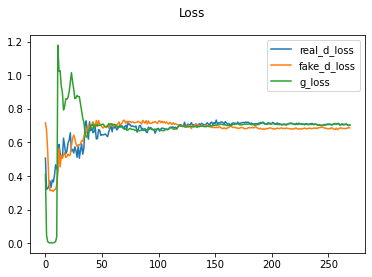

In [51]:
plt.suptitle('Loss')
plt.plot(hist.history['real_d_loss'], label='real_d_loss')
plt.plot(hist.history['fake_d_loss'], label='fake_d_loss')
plt.plot(hist.history['g_loss'], label='g_loss')
plt.legend()
plt.show()

In [52]:
log_dir= os.path.join('./logs', 'model')
os.makedirs(log_dir, exist_ok=True)

In [53]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [54]:
# %reload_ext tensorboard

In [55]:
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 7522), started 0:00:40 ago. (Use '!kill 7522' to kill it.)

<IPython.core.display.Javascript object>

In [56]:
imgs = generator.predict(tf.random.normal((16, 100, 1)))

1/1 [==============================] - 0s 22ms/step


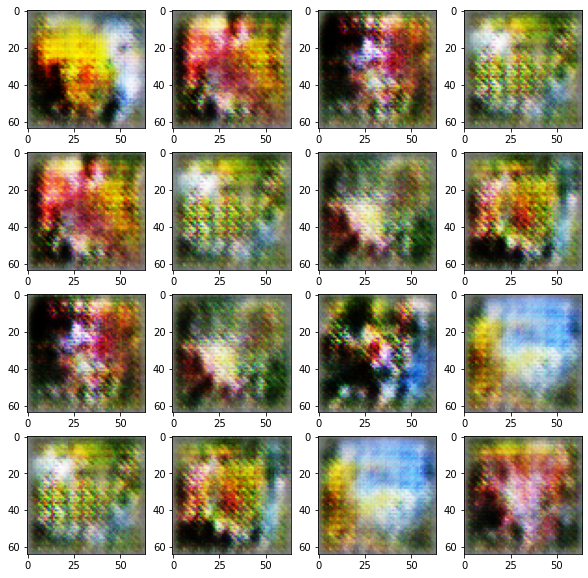

In [57]:
fig, ax = plt.subplots(ncols=4, nrows=4, figsize=(10,10))
for r in range(4): 
    for c in range(4): 
        ax[r][c].imshow(imgs[(r+1)*(c+1)-1])

In [58]:
# Download outputs
from google.colab import files
files.download(generator_filepath)
files.download(os.path.join(gan_image_dir, 'generated_img_260.png'))
files.download(os.path.join(log_dir, 'train','events.out.tfevents.1678478337.1ba4e5b9bc5c.727.0.v2'))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

1/1 [==============================] - 0s 270ms/step


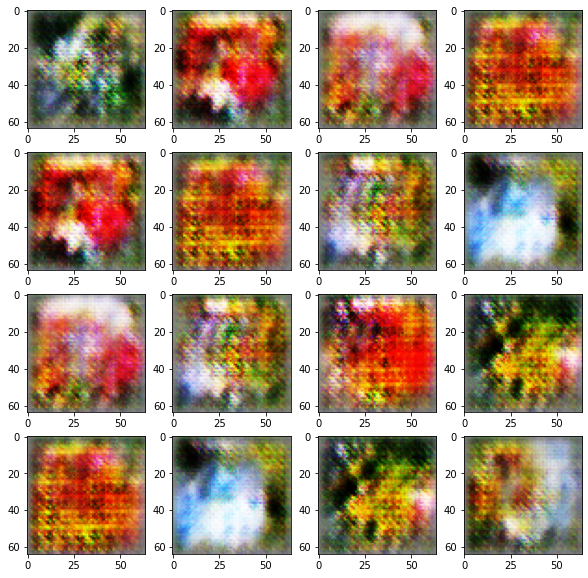

In [59]:
from keras.models import load_model

# Load the model for everyone wants observe the generarted image
model = load_model(generator_filepath, compile=False)
imgs = model.predict(tf.random.normal((16, 100, 1)))

fig, ax = plt.subplots(ncols=4, nrows=4, figsize=(10,10))
for r in range(4): 
    for c in range(4): 
        ax[r][c].imshow(imgs[(r+1)*(c+1)-1])